# Livrable 2 - Denoising d'images

Mauvaise équipe : Tabard Guillaume ,  Thery Loan, Badaoui Carl

# 1. Introduction

## 1.1. Présentation du problème de débruitage d'image

L'entreprise TouNum se spécialise dans la numérisation de documents physiques, souvent sollicitée pour la transformation de grandes bases de documents papier en formats numériques. Cependant, lors du processus de numérisation, les images générées peuvent être altérées par différents types de bruit, rendant difficile leur traitement ultérieur, notamment pour des tâches telles que la classification automatique ou la génération de légendes descriptives d’images (captioning).

Le bruit dans les images numérisées peut se manifester de plusieurs façons : sous forme de points aléatoires, de stries ou d’autres artefacts visuels. Ces éléments nuisent à la qualité des données et affectent directement les performances des algorithmes d'apprentissage machine qui seront appliqués par la suite. Par conséquent, le débruitage des images (denoising) devient une étape cruciale pour garantir la fiabilité et la précision des modèles, en particulier pour une tâche aussi ambitieuse que le captioning.

L’objectif de ce livrable est de fournir une solution de débruitage efficace, une première étape dans le pipeline complet de traitement des images. L'idée est de nettoyer ces images avant leur utilisation pour des tâches plus complexes comme la classification binaire ou la génération automatique de légendes, un service que TouNum souhaite offrir à ses clients.

## 1.2. Objectifs du Notebook

L'objectif de ce notebook est de mettre en œuvre une solution de débruitage d'images en utilisant des auto-encodeurs convolutifs. Nous chercherons à :

- Préparer les données d'images pour l'entraînement du modèle.
- Construire et entraîner un auto-encodeur convolutif pour le débruitage d'images.
- Évaluer les performances du modèle et visualiser les résultats.
- Fournir une analyse critique des résultats et identifier les domaines potentiels d'amélioration.

## 1.3. Qu'est ce qu'un auto-encodeur ?

Les auto-encodeurs sont un type de réseau de neurones utilisé pour l'apprentissage non supervisé. Ils visent à apprendre une représentation (encodage) efficace des données, généralement dans le but de réduire la dimensionnalité. Un auto-encodeur est structuré en deux parties principales :

- Encodeur : Il apprend à compresser l'entrée dans une forme latente, souvent de dimensionnalité réduite.
- Décodeur : Il apprend à reconstruire l'entrée à partir de cette forme latente.

Dans le cadre du débruitage d'image, l'auto-encodeur apprend à mapper les images bruitées vers des versions "propres", en supprimant les artefacts tout en conservant les détails importants. Ce modèle est particulièrement utile dans des scénarios où les données d'image sont de faible qualité, comme c'est le cas avec certaines images numérisées par TouNum.

# 2. Importation et exploration des données

## 2.1. Importation des bibliothèques nécessaires

Nous utiliserons des bibliothèques Python communes, comme TensorFlow pour construire le modèle d’auto-encodeur,NumPy et MatPlotLib pour la manipulation et la visualisation des données.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from skimage.metrics import peak_signal_noise_ratio as psnr

print("Import terminé.")

Import terminé.


In [3]:
import os

data_dir = '/content/drive/My Drive/dataset_livrable2'
image_files = os.listdir(data_dir)
print(image_files)

['noisy_002.jpg', 'noisy_003.jpg', 'noisy_001.jpg', 'noisy_004.jpg', 'noisy_019.jpg', 'noisy_009.jpg', 'noisy_047.jpg', 'noisy_040.jpg', 'noisy_023.jpg', 'noisy_018.jpg', 'noisy_032.jpg', 'noisy_031.jpg', 'noisy_044.jpg', 'noisy_028.jpg', 'noisy_012.jpg', 'noisy_045.jpg', 'noisy_005.jpg', 'noisy_013.jpg', 'noisy_036.jpg', 'noisy_046.jpg', 'noisy_007.jpg', 'noisy_008.jpg', 'noisy_038.jpg', 'noisy_006.jpg', 'noisy_015.jpg', 'noisy_042.jpg', 'noisy_037.jpg', 'noisy_035.jpg', 'noisy_048.jpg', 'noisy_020.jpg', 'noisy_026.jpg', 'noisy_033.jpg', 'noisy_043.jpg', 'noisy_010.jpg', 'noisy_017.jpg', 'noisy_039.jpg', 'noisy_016.jpg', 'noisy_034.jpg', 'noisy_014.jpg', 'noisy_029.jpg', 'noisy_024.jpg', 'noisy_021.jpg', 'noisy_025.jpg', 'noisy_030.jpg', 'noisy_041.jpg', 'noisy_027.jpg', 'noisy_022.jpg', 'noisy_091.jpg', 'noisy_069.jpg', 'noisy_064.jpg', 'noisy_072.jpg', 'noisy_071.jpg', 'noisy_079.jpg', 'noisy_088.jpg', 'noisy_073.jpg', 'noisy_059.jpg', 'noisy_057.jpg', 'noisy_051.jpg', 'noisy_066.jp

## 2.2. Chargement du dataset d'images

Le dataset fourni par TouNum contient des images étiquetées, certaines bruitées, d'autres non. Ce jeu de données sera utilisé pour entraîner notre modèle de débruitage.

In [4]:
# Paramètres des images
img_height, img_width, rgb = 256, 256, 3
input_img = Input(shape=(img_height, img_width, rgb))
images = []

for img_file in image_files:
    img_path = os.path.join(data_dir, img_file)
    img = image.load_img(img_path, target_size=(256, 256))
    img_array = image.img_to_array(img)
    images.append(img_array)

images = np.array(images)

print("Chargement terminé.")

Chargement terminé.


## 2.3. Exploration des données

In [5]:
# Afficher quelques informations de base sur les données
print(f"Nombre total d'images : {images.shape[0]}")
print(f"Dimensions des images : {images.shape[1:]}")
print(f"Valeur min des pixels : {np.min(images)}")
print(f"Valeur max des pixels : {np.max(images)}")

Nombre total d'images : 148
Dimensions des images : (256, 256, 3)
Valeur min des pixels : 0.0
Valeur max des pixels : 255.0


## 2.4. Visualisation d'exemples d'images

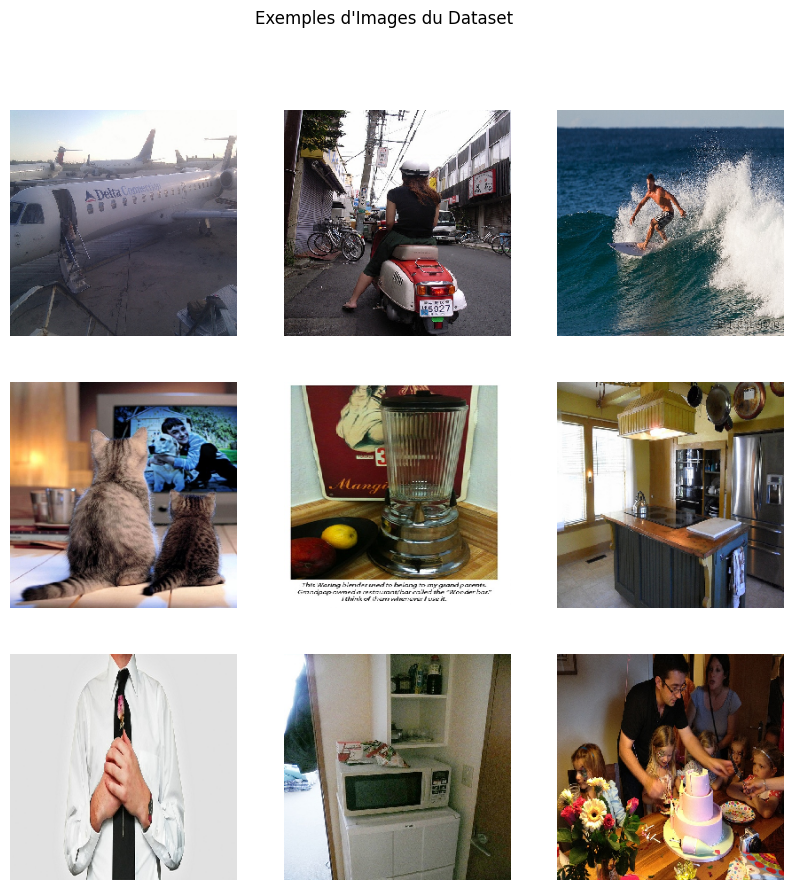

In [6]:
# Afficher quelques images
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(images[i].astype('uint8'))
    plt.axis('off')
plt.suptitle('Exemples d\'Images du Dataset')
plt.show()

## 2.5. Distribution des valeurs de pixel

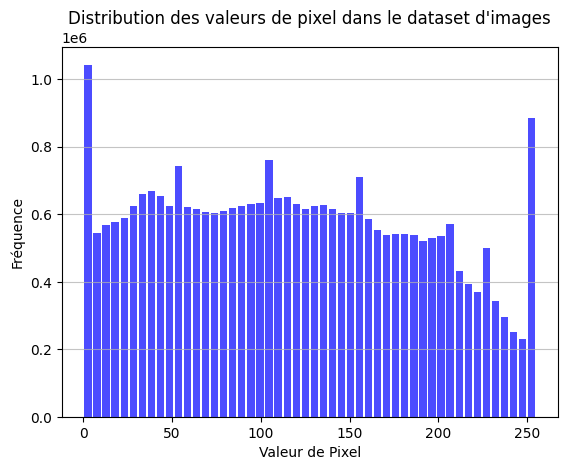

La valeur moyenne des pixels est: 117.62
L'écart-type des valeurs de pixel est: 71.52


In [7]:
# Calculer la distribution des valeurs de pixel
pixel_values = images.flatten()
plt.hist(pixel_values, bins=50, color='blue', alpha=0.7, rwidth=0.8)
plt.title('Distribution des valeurs de pixel dans le dataset d\'images')
plt.xlabel('Valeur de Pixel')
plt.ylabel('Fréquence')
plt.grid(axis='y', alpha=0.75)
plt.show()

# Calculer et afficher la moyenne et l'écart-type des valeurs de pixel
mean_pixel_value = np.mean(pixel_values)
std_pixel_value = np.std(pixel_values)
print(f"La valeur moyenne des pixels est: {mean_pixel_value:.2f}")
print(f"L'écart-type des valeurs de pixel est: {std_pixel_value:.2f}")

* Moyenne des pixels :

La valeur moyenne des pixels de 117.62 suggère que, sur une échelle de 0 (noir) à 255 (blanc), nos images tendent à être d'une luminosité modérée à élevée. Cela pourrait signifier que nos images sont relativement claires, mais avec une présence notable de zones plus sombres puisque la moyenne n'est pas extrêmement élevée.

* Écart-Type des Pixels :

Un écart-type de 71.52 indique une assez grande variabilité dans les valeurs des pixels à travers l'ensemble des images. Cela signifie que bien que la moyenne des valeurs de pixel soit relativement élevée, il y a une quantité significative de pixels qui sont soit beaucoup plus clairs, soit beaucoup plus sombres que la moyenne.

# 3. Préparation des données

## 3.1. Normalisation des images

Pour faciliter l’entraînement du modèle de machine learning, les images seront normalisées en divisant les valeurs des pixels par 255, ce qui les ramène dans la plage [0, 1]. Cela aide à éviter des gradients trop importants ou trop faibles lors de l'entraînement du modèle.

In [8]:
# Normaliser les images pour que les valeurs de pixel soient dans [0, 1]
normalized_images = images / 255.0

print("Normalisation terminé.")

Normalisation terminé.


## 3.2. Bruitage artificiel des images

On introduit un bruit artificiel dans les données d'entraînement pour forcer le modèle à apprendre à reconstruire l'image originale à partir de sa version bruitée.

On a choisi une `noise_factor` de `0.15` après une série d'expérimentations et d'observations. Ce niveau de bruit est suffisant pour introduire un défi pour l'auto-encodeur tout en préservant les caractéristiques clés des images pour que le modèle puisse apprendre efficacement à les reconstruire.

On va également tester un `noise_factor` de `0.40` afin de vérifier la puissance du modèle en utilisant un bruit nettement plus fort.

In [9]:
# Paramètres pour l'ajout de bruit
noise_factor_015 = 0.15
noise_factor_040 = 0.40

# Ajout d'un bruit gaussien léger aux images
noisy_images_015 = normalized_images + noise_factor_015 * np.random.normal(loc=0.0, scale=1.0, size=normalized_images.shape)
noisy_images_015 = np.clip(noisy_images_015, 0., 1.)

# Ajout d'un bruit gaussien fort aux images
noisy_images_040 = normalized_images + noise_factor_040 * np.random.normal(loc=0.0, scale=1.0, size=normalized_images.shape)
noisy_images_040 = np.clip(noisy_images_040, 0., 1.)

print("Bruitage terminé.")

Bruitage terminé.


## 3.3. Division en série d'entraînement et de test

On a opté pour une répartition de 80% des données pour l'entraînement et 20% pour le test pour garantir que le modèle puisse généraliser sur des données qu'il n'a jamais vues.

In [10]:
# Diviser les données en ensembles d'entraînement et de test
X_train_015, X_test_015, y_train_015, y_test_015 = train_test_split(
    noisy_images_015,   # Entrée (images bruitées)
    normalized_images,  # Cibles (images originales)
    test_size=0.2,
    random_state=42
)

# Diviser les données en ensembles d'entraînement et de test
X_train_040, X_test_040, y_train_040, y_test_040 = train_test_split(
    noisy_images_040,   # Entrée (images bruitées)
    normalized_images,  # Cibles (images originales)
    test_size=0.2,
    random_state=42
)

print("Jeux de données constitués")

Jeux de données constitués


## 3.4. Visualisation des images bruitées

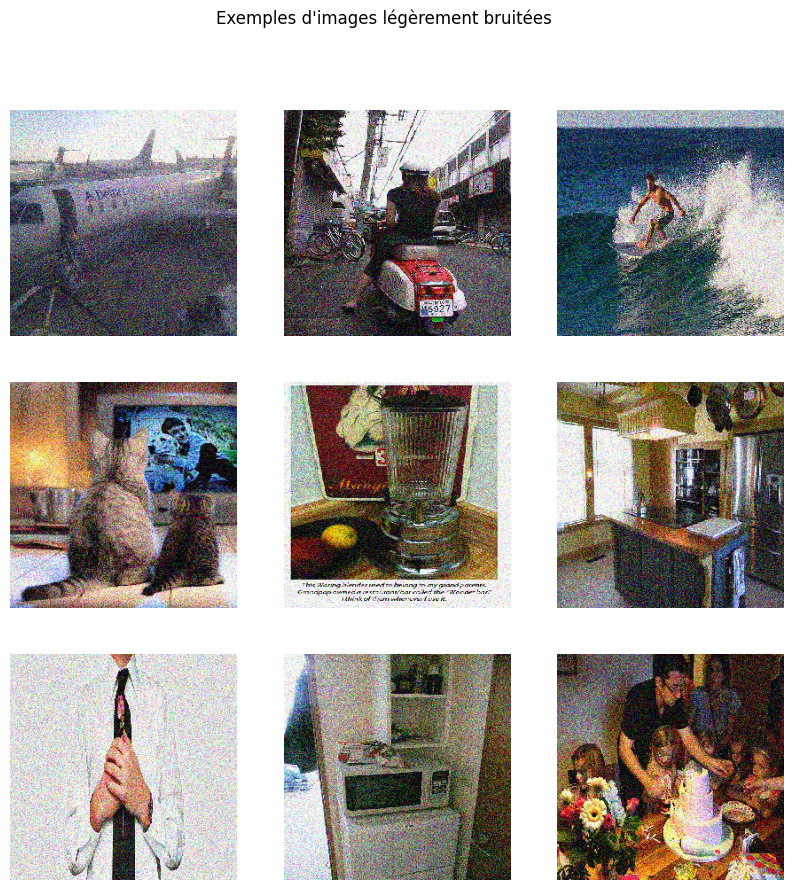

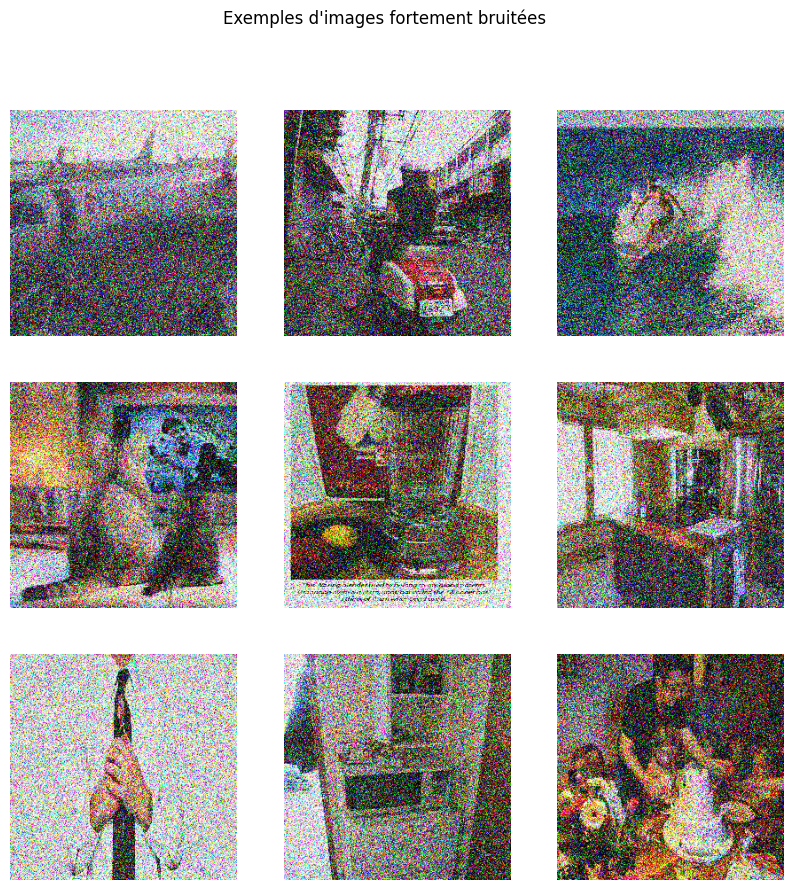

In [11]:
# Afficher quelques images légèrement bruitées
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(noisy_images_015[i].astype('float32'))
    plt.axis('off')
plt.suptitle('Exemples d\'images légèrement bruitées')
plt.show()

# Afficher quelques images fortement bruitées
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(noisy_images_040[i].astype('float32'))
    plt.axis('off')
plt.suptitle('Exemples d\'images fortement bruitées')
plt.show()

On constate bien que les images sont bruités. Cela fonctionne bien.

# 4. Construction de l'auto-encodeur convolutif

In [12]:
# Définition des images
input_img = Input(shape=(img_height, img_width, rgb))

print("Paramètres appliqués.")

Paramètres appliqués.


## 4.1. Architecture de l'encodeur

On utilise ici une série de couches convolutives et de pooling pour progressivement réduire la dimensionnalité de l'entrée. Les couches convolutives extraient les caractéristiques spatiales des images, tandis que les couches de pooling réduisent les dimensions spatiales (hauteur et largeur), compactant ainsi l'information.

In [13]:
# Paramètres de l'encodeur
encoder_params = [
    {"filters": 64, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"pool_size": (2, 2), "padding": 'same'},
    {"filters": 128, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"pool_size": (2, 2), "padding": 'same'}
]

# Encodeur
x = input_img
for i in range(0, len(encoder_params), 2):
    x = Conv2D(**encoder_params[i])(x)
    x = MaxPooling2D(**encoder_params[i+1])(x)
encoded = x

print("Encodeur paramétré.")

Encodeur paramétré.


## 4.2. Architecture du décodeur

On cherche à reconstruire l'image d'origine via un série de couches convolutives et d'opérations d'upsampling. Les couches convolutives dans le décodeur servent à générer de nouvelles caractéristiques à partir de l'espace latent, tandis que les couches d'upsampling augmentent progressivement la hauteur et la largeur des volumes de sortie.

In [14]:
# Paramètres du décodeur
decoder_params = [
    {"filters": 128, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"size": (2, 2)},
    {"filters": 64, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"size": (2, 2)},
    {"filters": rgb, "kernel_size": (3, 3), "activation": 'sigmoid', "padding": 'same'}
]

# Décodeur
for i in range(0, len(decoder_params)-1, 2):
    x = Conv2D(**decoder_params[i])(x)
    x = UpSampling2D(**decoder_params[i+1])(x)
x = Conv2D(**decoder_params[-1])(x)
decoded = x

print("Décodeur paramétré.")

Décodeur paramétré.


## 4.3. Modèle d'auto-encodeur complet

Le modèle complet combine l’encodeur et le décodeur, créant un pipeline de bout en bout pour transformer des images bruitées en versions propres.

In [15]:
# Construction du modèle d'auto-encodeur complet
autoencoder = Model(input_img, decoded)
autoencoder.summary()

# Augmentation des données
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=True
)

autoencoder.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

autoencoder.save("autoencoder_model.h5")

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d (UpSampling2D)         │ (None, 128, 128, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 128, 128, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_1 (UpSampling2D)       │ (None, 256, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 256, 256, 3)         │           1,731 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 298,755 (1.14 MB)

 Trainable params: 298,755 (1.14 MB)

 Non-trainable params: 0 (0.00 B)

# 5. Entraînement du modèle

## 5.1. Définition des hyperparamètres

Les hyperparamètres tels que la taille des mini-batchs, et le nombre d’époques seront définis ici. Ils influenceront la vitesse et la qualité de l’apprentissage du modèle.

In [16]:
# Paramètres globaux
epochs = 150
batch_size = 4

# Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    verbose=1,
    patience=10,
    restore_best_weights=True)

print("Hyperparamètres définis.")

Hyperparamètres définis.


## 5.2. Entraînement de l'auto-encodeur

In [17]:
history_015 = autoencoder.fit(
    X_train_015,  # images bruitées
    y_train_015,  # images originales
    epochs=epochs,
    batch_size=batch_size,
    shuffle=True,
    validation_data=(X_test_015, y_test_015),
    callbacks=[early_stopping],
)

print("Auto-encodeur 015 entraîné.")

Epoch 1/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 23s 412ms/step - accuracy: 0.4102 - loss: 0.6434 - val_accuracy: 0.3327 - val_loss: 0.5824
Epoch 2/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.3716 - loss: 0.5594 - val_accuracy: 0.6704 - val_loss: 0.5589
Epoch 3/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.5793 - loss: 0.5422 - val_accuracy: 0.7108 - val_loss: 0.5418
Epoch 4/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.6539 - loss: 0.5339 - val_accuracy: 0.7177 - val_loss: 0.5386
Epoch 5/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - accuracy: 0.6516 - loss: 0.5315 - val_accuracy: 0.6816 - val_loss: 0.5346
Epoch 6/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - accuracy: 0.6912 - loss: 0.5338 - val_accuracy: 0.7434 - val_loss: 0.5344
Epoch 7/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.7068 - loss: 0.5338 - val_accuracy: 0.7899 - val_loss: 0.5356
Epoch 8/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.7350 - loss: 0.5335 - val_accuracy: 

In [18]:
history_040 = autoencoder.fit(
    X_train_040,  # images bruitées
    y_train_040,  # images originales
    epochs=epochs,
    batch_size=batch_size,
    shuffle=True,
    validation_data=(X_test_040, y_test_040),
    callbacks=[early_stopping],
)

print("Auto-encodeur 040 entraîné.")

Epoch 1/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.6308 - loss: 0.5565 - val_accuracy: 0.7392 - val_loss: 0.5347
Epoch 2/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.6864 - loss: 0.5351 - val_accuracy: 0.7452 - val_loss: 0.5340
Epoch 3/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.6982 - loss: 0.5360 - val_accuracy: 0.5947 - val_loss: 0.5338
Epoch 4/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.6760 - loss: 0.5324 - val_accuracy: 0.7010 - val_loss: 0.5322
Epoch 5/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.7294 - loss: 0.5229 - val_accuracy: 0.6121 - val_loss: 0.5347
Epoch 6/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.6946 - loss: 0.5291 - val_accuracy: 0.7228 - val_loss: 0.5330
Epoch 7/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.7126 - loss: 0.5253 - val_accuracy: 0.7309 - val_loss: 0.5317
Epoch 8/150
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.6929 - loss: 0.5324 - val_accuracy: 0.

Il y a un "early stopping" parce que le modèle est suffisamment entrainé.

## 5.3. Visualisation de la loss durant l'entraînement

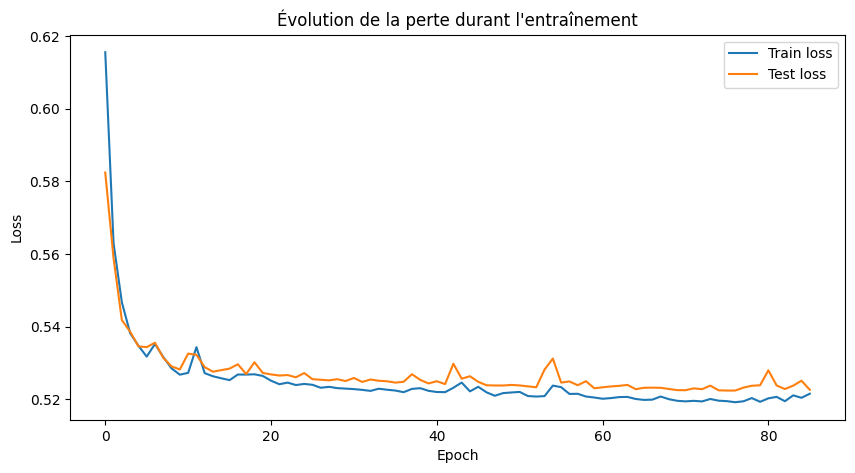

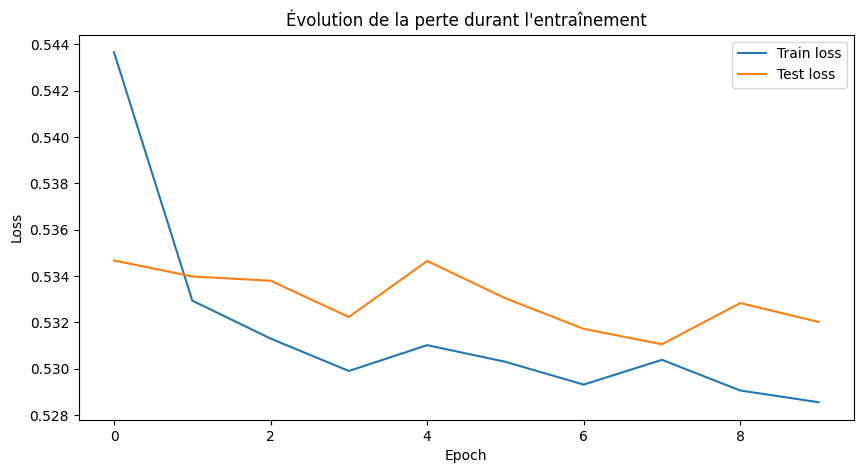

In [19]:
# Tracer l'historique de la perte durant l'entraînement (images légèrement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_015.history['loss'], label='Train loss')
plt.plot(history_015.history['val_loss'], label='Test loss')
plt.title('Évolution de la perte durant l\'entraînement')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Tracer l'historique de la perte durant l'entraînement (images fortement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_040.history['loss'], label='Train loss')
plt.plot(history_040.history['val_loss'], label='Test loss')
plt.title('Évolution de la perte durant l\'entraînement')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

Premier graphique (images légèrement bruitées) :
Train loss et Test loss évoluent de manière similaire avec une tendance à la baisse rapide au début de l'entraînement, ce qui est un signe positif. La perte semble se stabiliser autour de 0.52.
Cela indique que le modèle parvient à apprendre à débruiter les images bruitées et à généraliser cette capacité aux données de test. L'absence de sur-apprentissage visible suggère que le modèle a un bon pouvoir de généralisation avec un niveau de bruit modéré.

Deuxième graphique (images fortement bruitées) :
Ici, la perte semble commencer plus haut (vers 0.60), mais descend rapidement pour s'approcher d'une stabilisation autour de 0.52 également. Cependant, la perte est légèrement plus instable, notamment au niveau des données de test.
Cela peut indiquer que le modèle rencontre davantage de difficultés à apprendre à partir de ces images fortement bruitées, avec une légère tendance à la sur-apprentissage à certaines étapes (les fluctuations sur la courbe orange du test loss).

## 5.4. Visualisation de l'accuracy durant l'entraînement

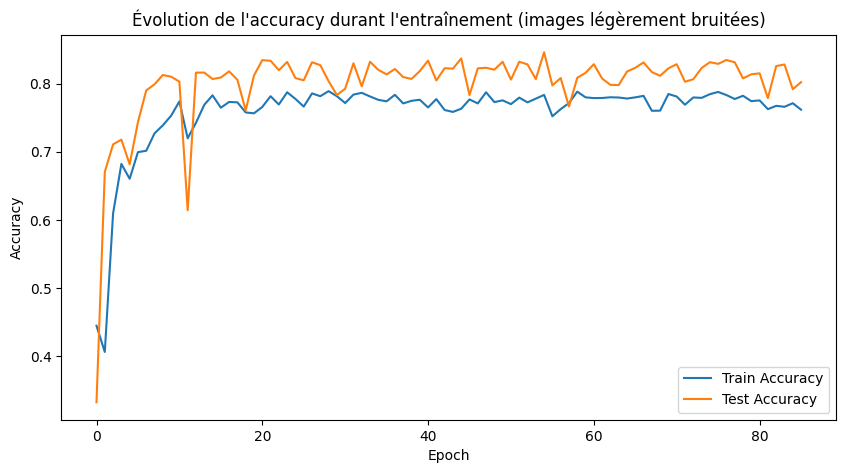

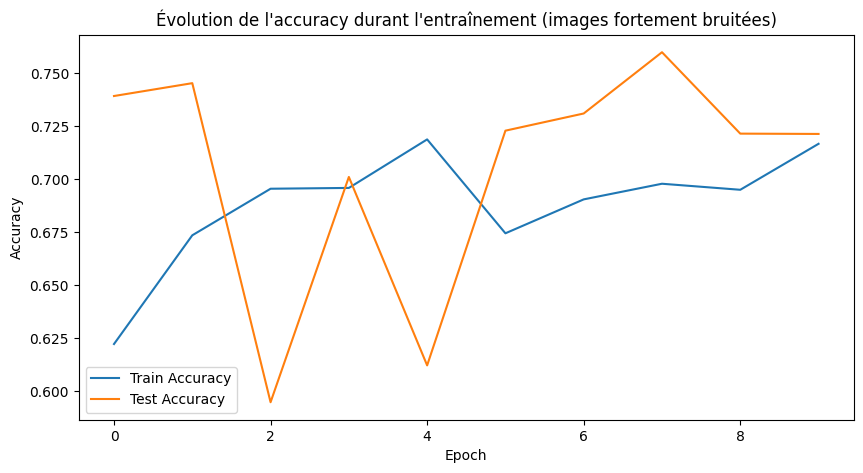

In [20]:
# Tracer l'historique de l'accuracy durant l'entraînement (images légèrement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_015.history['accuracy'], label='Train Accuracy')
plt.plot(history_015.history['val_accuracy'], label='Test Accuracy')
plt.title('Évolution de l\'accuracy durant l\'entraînement (images légèrement bruitées)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Tracer l'historique de l'accuracy durant l'entraînement (images fortement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_040.history['accuracy'], label='Train Accuracy')
plt.plot(history_040.history['val_accuracy'], label='Test Accuracy')
plt.title('Évolution de l\'accuracy durant l\'entraînement (images fortement bruitées)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Premier graphique (images légèrement bruitées) :
L'accuracy monte rapidement pour atteindre un plateau autour de 0.8 à 0.85, ce qui indique que le modèle parvient à bien débruiter les images légèrement bruitées.
Le fait que l'accuracy du train et du test soient proches suggère une bonne capacité de généralisation sans surapprentissage, même pour les données de test.

Deuxième graphique (images fortement bruitées) :
On observe ici une instabilité beaucoup plus marquée, avec l'accuracy qui fluctue plus drastiquement au début de l'entraînement, en particulier pour les données de test.
Vers la fin, l'accuracy de test semble se stabiliser autour de 0.72, un peu en dessous des résultats obtenus pour les images légèrement bruitées. Cela indique que le modèle parvient à bien débruiter les images fortement bruitées, mais il rencontre plus de difficultés à maintenir une performance stable.

# 6. Évaluation du modèle

## 6.1. Évaluation quantitative du modèle sur l'ensemble de test via PSNR

Le **PSNR**, ou Peak Signal-to-Noise Ratio, est une métrique couramment utilisée pour mesurer la qualité d'une image reconstruite par rapport à l'image originale. Il est souvent utilisé dans le contexte de la compression d'images ou de la restauration d'images.

En général, un PSNR plus élevé indique une meilleure qualité. Dans le contexte des images, une valeur de PSNR supérieure à 40 dB est souvent considérée comme une qualité d'image élevée. Une valeur autour de 20-25 dB est considérée comme acceptable. Une valeur en dessous de 20 dB indique généralement une qualité d'image médiocre.

In [21]:
# Prédiction des images débruitées à partir des images bruitées de test
decoded_imgs_015 = autoencoder.predict(X_test_015)
decoded_imgs_040 = autoencoder.predict(X_test_040)

# Initialisation des métriques
psnr_vals = []

# Calcul du PNSR pour les images ayant été légèrement bruitées
for orig, pred in zip(y_test_015, decoded_imgs_015):
    orig = orig.astype("float32")
    pred = pred.astype("float32")

    # Calcul et stockage du PSNR pour chaque paire d'images
    psnr_vals.append(psnr(orig, pred, data_range=orig.max() - orig.min()))

# Calcul de la moyenne du PSNR
mean_psnr = np.mean(psnr_vals)
print(f"Mean PSNR (0.15): {mean_psnr:.2f}")

# Réinitialisation des métriques
psnr_vals = []

# Calcul du PNSR pour les images ayant été fortement bruitées
for orig, pred in zip(y_test_040, decoded_imgs_040):
    orig = orig.astype("float32")
    pred = pred.astype("float32")

    # Calcul et stockage du PSNR pour chaque paire d'images
    psnr_vals.append(psnr(orig, pred, data_range=orig.max() - orig.min()))

# Calcul de la moyenne du PSNR
mean_psnr = np.mean(psnr_vals)
print(f"Mean PSNR (0.40): {mean_psnr:.2f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Mean PSNR (0.15): 15.70
Mean PSNR (0.40): 20.93


**PSNR (0.15) = 15.70** : Une valeur de PSNR de 15.70 dB pour les images légèrement bruitées suggère une qualité modérée de reconstruction. Ainsi, ce résultat suggère que la qualité de reconstruction pourrait être améliorée.

**PSNR (0.40) = 20.93** : Une valeur de PSNR de 20.93 dB pour les images fortement bruitées est meilleure que celle pour les images légèrement bruitées. Cela suggère que le modèle a mieux performé sur les images fortement bruitées par rapport aux images légèrement bruitées, ce qui est un peu contre-intuitif. Habituellement, on s'attend à ce que le modèle performe moins bien sur des images avec un bruit plus fort.


## 6.2. Évaluation quantitative du modèle sur l'ensemble de test via MSE

Le **MSE**, ou Mean Squared Error, est une métrique de performance couramment utilisée pour mesurer l'erreur entre des valeurs prévues et des valeurs réelles. Dans le contexte de la reconstruction d'images (comme avec des auto-encodeurs), il quantifie l'écart entre les images reconstruites et les images originales.

In [22]:
# Calcul du MSE pour les images légèrement bruitées
mse_vals_015 = [mean_squared_error(orig.flatten(), pred.flatten()) for orig, pred in zip(y_test_015, decoded_imgs_015)]
mean_mse_015 = np.mean(mse_vals_015)
print(f"Mean MSE (0.15): {mean_mse_015:.3f}")

# Calcul du MSE pour les images fortement bruitées
mse_vals_040 = [mean_squared_error(orig.flatten(), pred.flatten()) for orig, pred in zip(y_test_040, decoded_imgs_040)]
mean_mse_040 = np.mean(mse_vals_040)
print(f"Mean MSE (0.40): {mean_mse_040:.3f}")

Mean MSE (0.15): 0.028
Mean MSE (0.40): 0.009


On obtient les résultats suivant :

**MSE (0.15) = 0.028** : Cette valeur est plus élevée que la deuxième, indiquant une plus grande différence entre les images reconstruites et les originales.

**MSE (0.40) = 0.009** : Cette valeur est relativement faible, indiquant une différence mineure entre les images reconstruites et les originales.

## 6.3. Visualisation des images débruitées

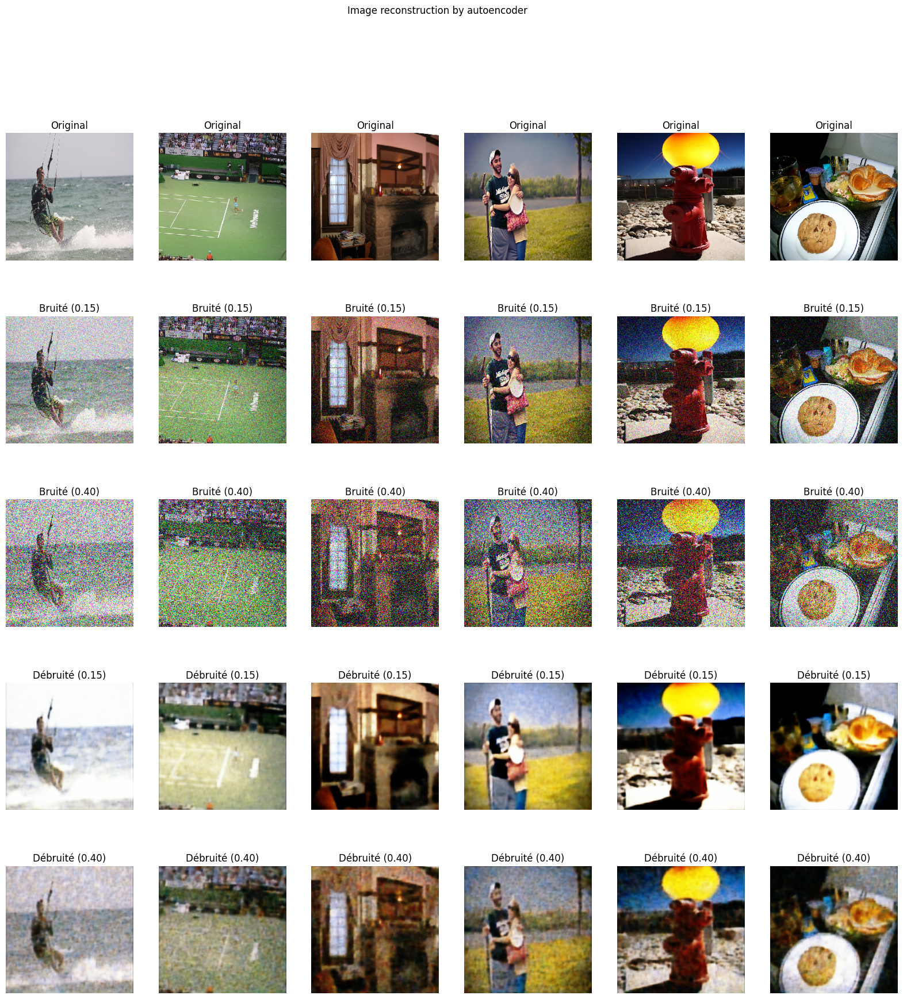

In [23]:
# Affichage des images originales, bruitées et débruitées
plt.figure(figsize=(20,20))
num_images_to_show = 6

for i in range(num_images_to_show):
    # Images originales
    ax = plt.subplot(5, num_images_to_show, i + 1)
    plt.imshow(y_test_015[i].reshape(img_height, img_width, rgb))
    plt.title("Original")
    plt.axis("off")

    # Images légèrement bruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + num_images_to_show)
    plt.imshow(X_test_015[i].reshape(img_height, img_width, rgb))
    plt.title("Bruité (0.15)")
    plt.axis("off")

    # Images fortement bruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + 2*num_images_to_show)
    plt.imshow(X_test_040[i].reshape(img_height, img_width, rgb))
    plt.title("Bruité (0.40)")
    plt.axis("off")

    # Images légèrement bruitées débruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + 3*num_images_to_show)
    plt.imshow(decoded_imgs_015[i].reshape(img_height, img_width, rgb))
    plt.title("Débruité (0.15)")
    plt.axis("off")

    # Images fortement bruitées débruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + 4*num_images_to_show)
    plt.imshow(decoded_imgs_040[i].reshape(img_height, img_width, rgb))
    plt.title("Débruité (0.40)")
    plt.axis("off")

plt.suptitle("Image reconstruction by autoencoder")
plt.show()

Images originales (ligne du haut) :

Ces images montrent des scènes variées (kitesurf, match de tennis, intérieur d'une pièce, personnes en plein air, hydrant, repas). Elles semblent avoir une bonne qualité visuelle sans distorsion ni bruit.
Images bruitées à un niveau de bruit de 0.15 (2ème ligne) :

Le bruit appliqué ici est relativement faible. Bien que des artefacts de bruit soient visibles, la scène et les détails principaux restent facilement reconnaissables.

Images bruitées à un niveau de bruit de 0.40 (3ème ligne) :

Ce niveau de bruit est nettement plus élevé, avec une perte de détails significative. Le bruit de type "poivre et sel" envahit l'image, rendant les objets et personnes moins reconnaissables.

On observe que l'image légèrement bruitée a été fidèlement reconstruite étant donné le faible niveau de bruit initial(0.15). La différence avant et après reconstruction est moins marquée. Par contre, la reconstruction de l'image fortement bruitée (0.40) est moins précise, ce qui est attendu étant donné le niveau de bruitage initial assez élevé.


Le projet a permis de développer une solution fonctionnelle pour le tri et le débruitage d'images numérisées.

Pour aller plus loin, des modèles de débruitage plus avancés pourraient être explorés, et le modèle pourrait être testé sur des ensembles de données plus variés pour assurer une meilleure robustesse.

En somme, cette première version fournit une base solide pour TouNum.